# Clean GeoJSON Data
***

*This explains how the geojson data is cleaned and adjusted. The original .json data is taken from [Github/Neogeografen/dagi](https://github.com/Neogeografen/dagi/tree/master/geojson).*

# 0. Settings

Load packages, specify settings:

In [1]:
import pandas as pd, plotly.express as px, json,os,Data
MapFile = "Data/kommuner.geojson"
label = "KOMNAVN"

Load data as in json format:

In [2]:
with open(f"{MapFile}", "r") as file:
    f = json.load(file)

The following sections can be summed up simply by running the function ```Data.AdjustData(f,label)```. We split it into a lot of steps to explain how this is done.

In [3]:
FinalData, Kommuner = Data.AdjustData(f,label)

# Rearranging geojson data for pyplot
## 1: Data structure and the problem

The function aggregates ```f``` which is a dictionary with geojson data. The first layer of the dictionary may include a number of keys; we are only interested in altering the key called ```features```. Thus, in the first step, we start by simply copying all keys that are not 'features':

In [14]:
g1 = {key: f[key] for key in f if key not in ('features')}
g1.keys()

dict_keys(['type', 'crs'])

Now, let's deal with the ```features```. In the geojson data this is a ```list``` of ```dict```'s. Each dictionary in the list specifies information on one geographic area, for instance the municipality of 'Hedensted'. Let us reference the dictionaries with information of a specific geographic area for ```g```, with a specific example ```gi```.

In [15]:
fts = f['features']
gi = fts[0]
gi.keys()

dict_keys(['type', 'properties', 'geometry'])

In [16]:
gi['properties']

{'KOMKODE': '0766', 'KOMNAVN': 'Hedensted'}

The dictionary ```gi``` may, again, contain a lot of information. We are only interested in altering a part of  the ```geometry``` entry. Under ```geometry``` we find the pieces of information that we may need to change, in order for us to be able to eventually plot the map of Danish municipalities. The dictionary usually includes (at least) the two keys: ```type```and ```coordinates```.

In [17]:
gi['geometry'].keys()

dict_keys(['type', 'coordinates'])

The ```type``` states what type of geographic representation the piece of information ```gi``` covers. For the ```pyplot``` methods we are considering in this setup to work, this can either be set $\lbrace$ ```Polygon```, ```MultiPolygon``` $\rbrace$. The polygon is a geometric shape that consists of coordinates that are connected by straight lines; the MultiPolygon allows for the geographic area to be described by multiple polygons (see e.g. https://gis.stackexchange.com/a/225396).

This is quite often the case with municipalities; for 'København' for instance, the geojson data uses 8 different polygons to represent the municipality (think of small islands and stuff like that). There might be a problem with the data in the following special case: The geojson data describes a geographical area with multiple polygons, but, they are included in the data as several instances of ```gi``` that are all of the type ```Polygon```. For the ```pyplot``` plotting facitilies to work properly, this needs to be rearranged into **one** geographical instance ```gi``` of the type ```MultiPolygon```. 

In [18]:
gi['geometry']['type'] # this is the problem

'Polygon'

**Data structure:** 

<img src="geojson_overview.png" width=600 height=600 >

## 2. Rearranging data as MultiPolygons: Step-by-step implementation of the data function

So, the problem is that there are multiple instances of ```gi``` that describe the same area (e.g. København). What we want to do, is to collect all of the ```gi``` that describe 'København', and merge them into a single ```gi``` with all the relevant ```coordinates``` merged into one ```MultiPolygon``` instead of many ```Polygon```s.

*1: Group all ```gi``` that describe the same area.*

Let us start by considering one area 'København':

In [19]:
mun_i = 'København'

To identify all the ```gi``` that describe this, we need to look all the way through to the 'properties' (lower-right corner of the figure above):

In [20]:
def list_mun_i(fts, mun_i,label):
    return [x for x in fts if x['properties'][label]==mun_i]

This looks through the list of features ```fts``` and keep those where the ```label``` corresponds to 'København' (our label is 'KOMNAVN'):

In [21]:
fts_mun_i = list_mun_i(fts,mun_i,label)

*2: Merge all ```fts_mun_i``` into one dictionary:*

```fts_mun_i``` now includes all the relevant ```gi``` that describes 'København'; each one of the ```gi``` is a dictionary. We are only interested in doing something with the ```geometry``` key, for all the others, we simply copy the original data. In this example we simply have:

In [22]:
def merge_nongeometry(fts_mun_i):
    return {k: fts_mun_i[0][k] for k in fts_mun_i[0] if k != 'geometry'}
fts_mun_i_nongeometry = merge_nongeometry(fts_mun_i)
fts_mun_i_nongeometry

{'type': 'Feature', 'properties': {'KOMKODE': '0101', 'KOMNAVN': 'København'}}

Merging the ```geometry``` part is the more complicated one. First, if there are multiple entries, we manually change the ```type``` to ```MultiPolygon``` as explained earlier. Second, we need to merge the ```coordinates``` to a list of nested lists. Specifically, a ```MultiPolygon``` is specified with the following nesting:
* Outer layer is a list $L$ of lists $LL$, where each list $l\in LL$ represents a ```Polygon```.
* The individual entries should already be ```Polygon```s (list of lists).

In [23]:
def merge_geometry(fts_mun_i):
    return {'type': 'MultiPolygon',
            'coordinates': [fts_mun_i[n]['geometry']['coordinates'] for n in range(len(fts_mun_i))]}
fts_mun_i_geometry = merge_geometry(fts_mun_i)

The final merged element is simply combination of the two merged elements:

In [24]:
def merge_fts(fts_mun_i):
    if len(fts_mun_i)==1:
        return fts_mun_i[0]
    else:
        return {**merge_nongeometry(fts_mun_i),**{'geometry': merge_geometry(fts_mun_i)}}
fts_mun_i_merged = merge_fts(fts_mun_i)

*3: Collect all the merged elements in one feature dictionary*

The example above showed how to merge the feature data for one municipaclity. We end with defining the relevant loops to do this over all municipalities:

In [25]:
def unique_labels(f,label):
    """ Set of all releveant municipalities """
    return set([f['features'][x]['properties'][label] for x in range(len(f['features']))])
def collect_data(f,label):
    return {**{k:v for k,v in f.items() if k!= 'features'}, # simply copy keys that are not 'features'
            **{'features': [merge_fts(list_mun_i(f['features'],mun_i,label)) for mun_i in unique_labels(f,label)]} # for each municipality, perform the merge described above
           }
def AdjustData(f,label):
    """ Return data, set of unique labels """
    return collect_data(f,label),list(unique_labels(f,label))

In [26]:
g,glabels = AdjustData(f,label)

*Create test data to check that plotting works:*

In [27]:
df = pd.DataFrame({label: glabels, 'Number': [1]*len(glabels)})

*Check that plotting works:*

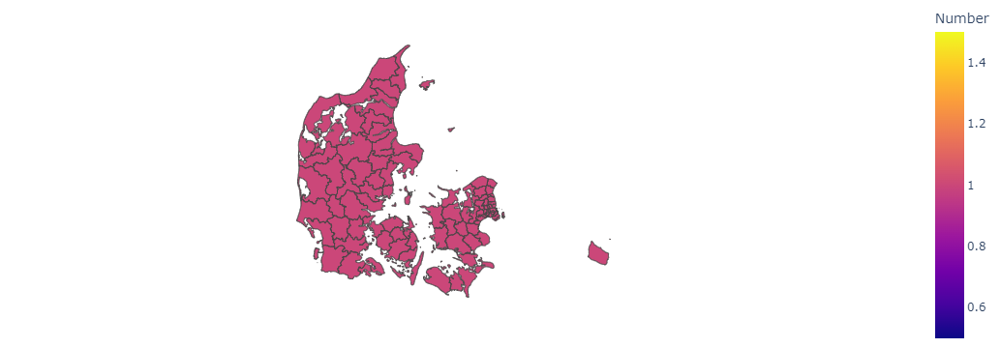

In [28]:
fig = px.choropleth(df, geojson=g, color="Number",
                    locations=f"{label}", featureidkey=f"properties.{label}",
                    projection="mercator"
                   )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()
# fig.write_image(f"{os.getcwd()}/{name}.pdf")